'wget' is not recognized as an internal or external command,
operable program or batch file.


In [20]:
# Importing dependancies
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import helper_functions

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from helper_functions import plot_loss_curves, compare_historys, make_confusion_matrix

In [21]:
# Setting dir paths
oil_dir = "C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset\\oily"
dry_dir = "C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset\\dry"
normal_dir ="C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset\\normal"


In [22]:
# Getting all the paths in a list for oil and dry skins
oil_list = []
for path in os.listdir(oil_dir):
  oil_list.append(oil_dir + "/" + path)

dry_list = []
for path in os.listdir(dry_dir):
  dry_list.append(dry_dir + "/" + path)
  
normal_list = []
for path in os.listdir(normal_dir):
  normal_list.append(normal_dir + "/" + path)

In [23]:
# Preprocess img function
IMG_SIZE = (224, 224)
def load_and_prep(filepath):
  img_path = tf.io.read_file(filepath)
  img = tf.io.decode_image(img_path)
  img = tf.image.resize(img, IMG_SIZE)

  return img

In [24]:
# Getting only those images which are suitable 
def corrImgs(arr):
  corrImgList = []
  for path in arr:
    img = load_and_prep(path)
    if (img.shape[2] == 3) | (img.shape == 4):
      corrImgList.append(path)
  
  return corrImgList

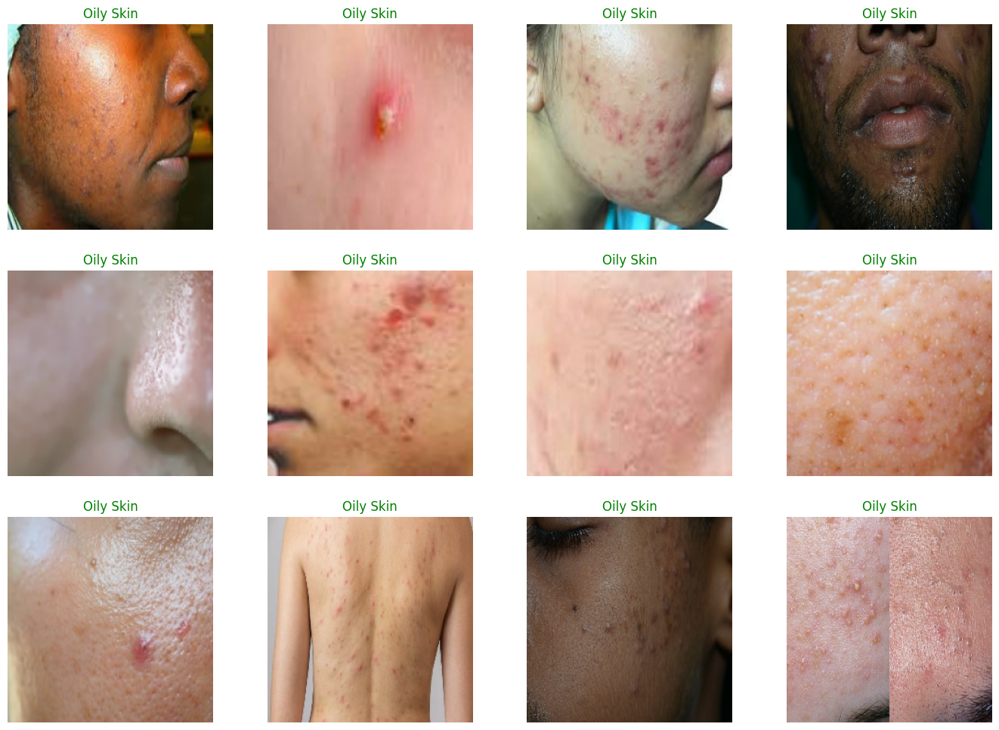

In [25]:
# Randomly plotting the Oily Skin images
random_oil_skin = np.random.choice(oil_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_oil_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Oily Skin", color="green")

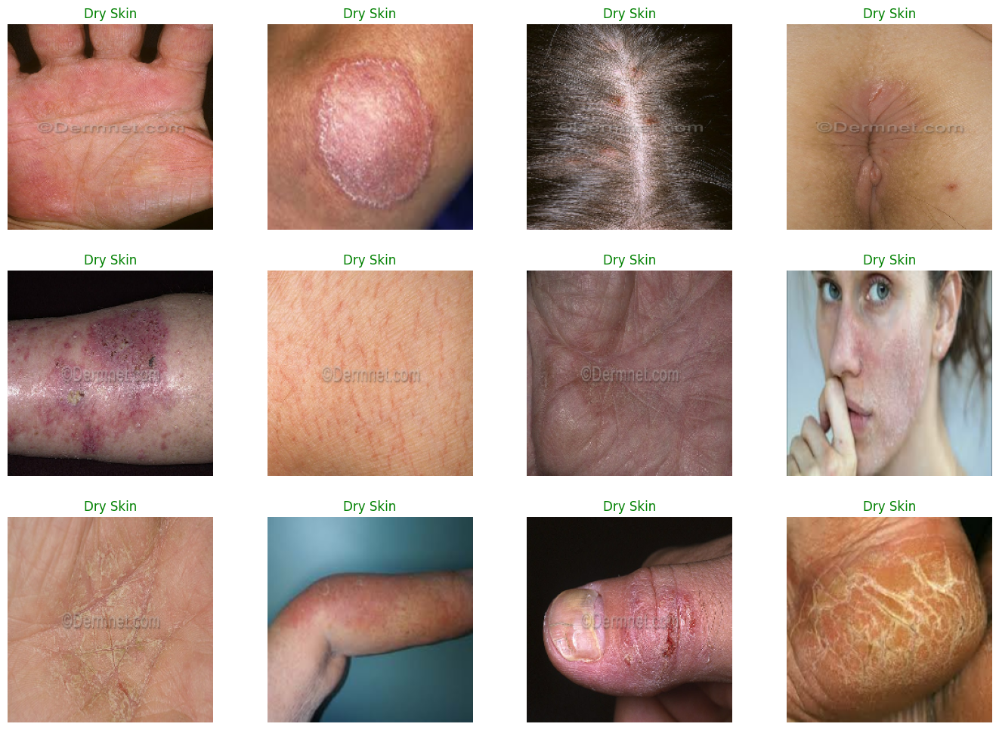

In [26]:
# Randomly plotting the Dry Skin images
random_dry_skin = np.random.choice(dry_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_dry_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Dry Skin", color="green")

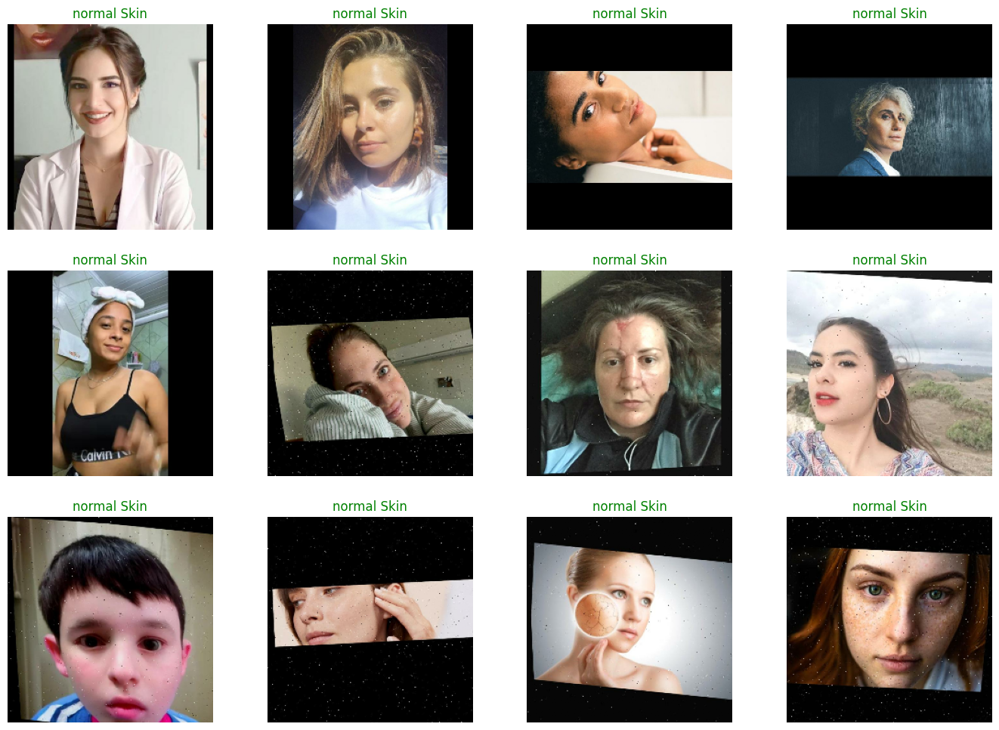

In [35]:
random_normal_skin = np.random.choice(normal_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_normal_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("normal Skin", color="green")

In [36]:
# Creating data augmentation layer
data_augmentation = tf.keras.Sequential([
   preprocessing.RandomFlip("horizontal"),
   preprocessing.RandomRotation(0.2),
   preprocessing.RandomZoom(0.2),
   preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
], name="data_augmentation_layer")

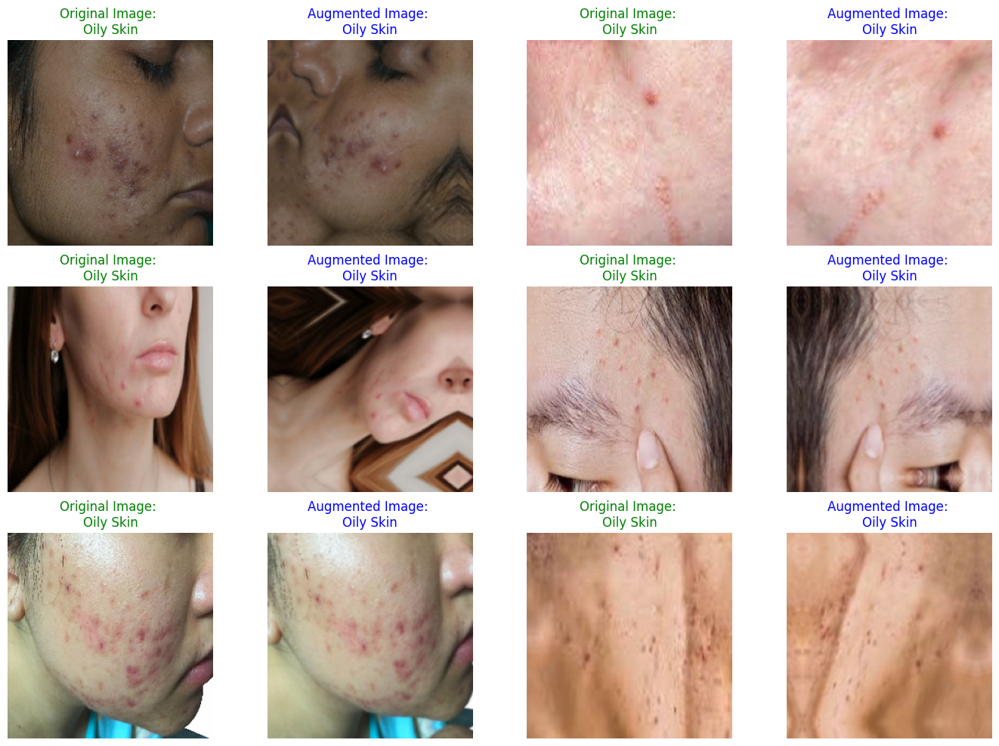

In [37]:
# Visualizing multiple randomly augmented oily skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Oily Skin"
  random_img_path = random.choice(oil_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

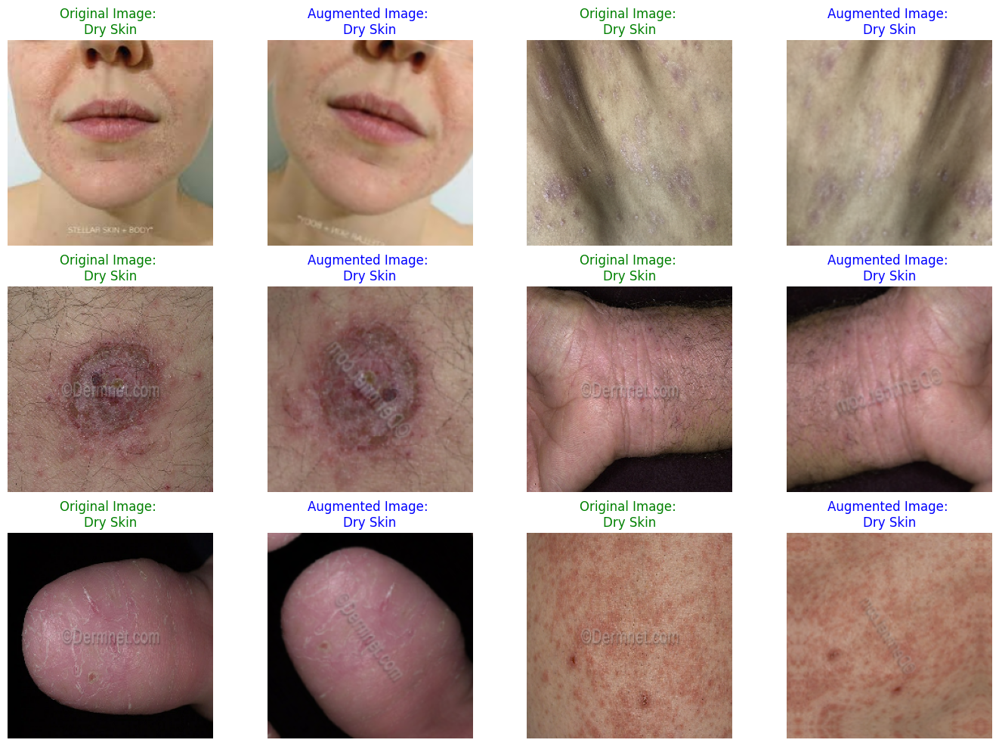

In [38]:
# Visualizing multiple randomly augmented dry skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Dry Skin"
  random_img_path = random.choice(dry_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

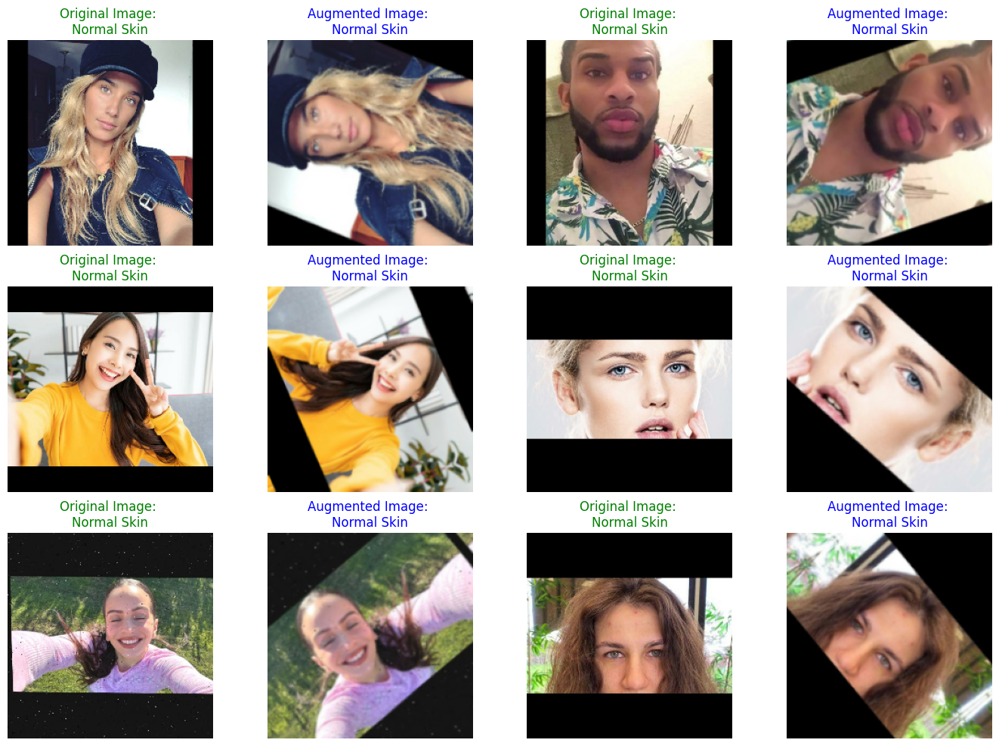

In [39]:
# Visualizing multiple randomly augmented normal skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Normal Skin"
  random_img_path = random.choice(normal_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

In [41]:
# Train test splits
data_gen = ImageDataGenerator(validation_split=0.2)

train_data = data_gen.flow_from_directory(directory="C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset",
                                          subset='training',
                                          target_size=IMG_SIZE)

test_data = data_gen.flow_from_directory(directory="C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset",
                                         subset='validation',
                                         target_size=IMG_SIZE)

Found 1296 images belonging to 3 classes.
Found 322 images belonging to 3 classes.


In [42]:
len(train_data), len(test_data)

(41, 11)

## Building the Model

In [44]:
# Setting up base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setting up input layer
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x) 
outputs = tf.keras.layers.Dense(3, activation="softmax", name="output_layer")(x) 
model_1 = tf.keras.Model(inputs, outputs)

# compiling the model
model_1.compile(loss=tf.keras.losses.categorical_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=0.25 * len(test_data))

Epoch 1/5
41/41 [==============================] - 107s 2s/step - loss: 0.3969 - accuracy: 0.8472 - val_loss: 0.1697 - val_accuracy: 0.9375
Epoch 2/5
41/41 [==============================] - 62s 2s/step - loss: 0.1380 - accuracy: 0.9630 - val_loss: 0.1670 - val_accuracy: 0.9583
Epoch 3/5
41/41 [==============================] - 57s 1s/step - loss: 0.1077 - accuracy: 0.9684 - val_loss: 0.1646 - val_accuracy: 0.9375
Epoch 4/5
41/41 [==============================] - 55s 1s/step - loss: 0.0936 - accuracy: 0.9769 - val_loss: 0.1508 - val_accuracy: 0.9375
Epoch 5/5
41/41 [==============================] - 53s 1s/step - loss: 0.0898 - accuracy: 0.9738 - val_loss: 0.1360 - val_accuracy: 0.9479


In [45]:
# Evaluating the model
model_1.evaluate(test_data)

11/11 [==============================] - 12s 1s/step - loss: 0.0993 - accuracy: 0.9720


[0.09931859374046326, 0.9720497131347656]

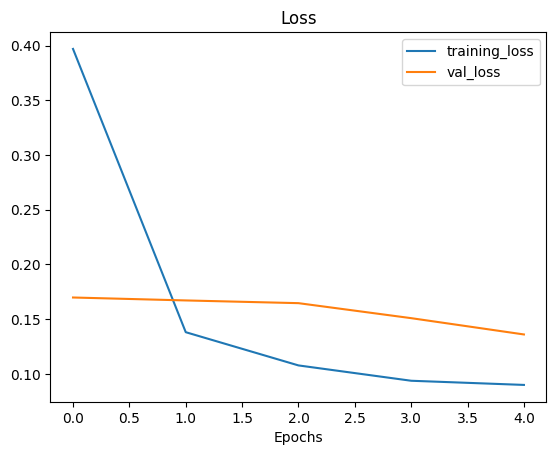

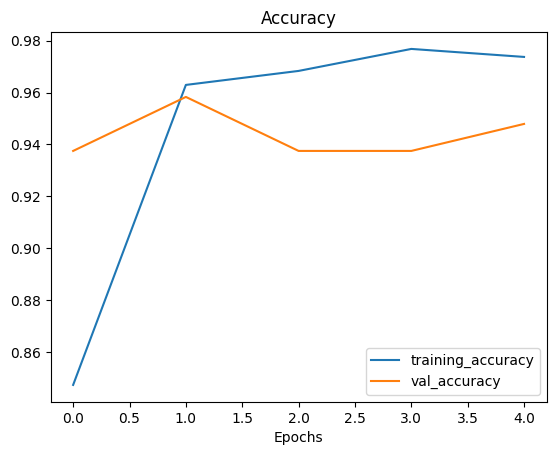

In [46]:
# Plotting loss curves
plot_loss_curves(history_1)

In [50]:
# Saving the model 
model_1.save("new_model.h5", save_format="h5")

In [51]:
# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
  layer.trainable = False

# Recompile model with lower learning rate
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(1e-4),
                metrics=['accuracy'])

# Fine-tune for 5 more epochs
fine_tune_epochs = 10 

history_1_fine_tune_1 = model_1.fit(train_data,
                                    epochs=fine_tune_epochs,
                                    validation_data=test_data,
                                    validation_steps= 0.25 * len(test_data), 
                                    initial_epoch=history_1.epoch[-1])

Epoch 5/10
41/41 [==============================] - 79s 2s/step - loss: 0.0753 - accuracy: 0.9745 - val_loss: 0.0496 - val_accuracy: 0.9896
Epoch 6/10
41/41 [==============================] - 71s 2s/step - loss: 0.0604 - accuracy: 0.9776 - val_loss: 0.1117 - val_accuracy: 0.9375
Epoch 7/10
41/41 [==============================] - 61s 1s/step - loss: 0.0401 - accuracy: 0.9877 - val_loss: 0.1003 - val_accuracy: 0.9688
Epoch 8/10
41/41 [==============================] - 55s 1s/step - loss: 0.0414 - accuracy: 0.9838 - val_loss: 0.0434 - val_accuracy: 0.9896
Epoch 9/10
41/41 [==============================] - 56s 1s/step - loss: 0.0321 - accuracy: 0.9884 - val_loss: 0.0815 - val_accuracy: 0.9583
Epoch 10/10
41/41 [==============================] - 58s 1s/step - loss: 0.0273 - accuracy: 0.9900 - val_loss: 0.0536 - val_accuracy: 0.9792


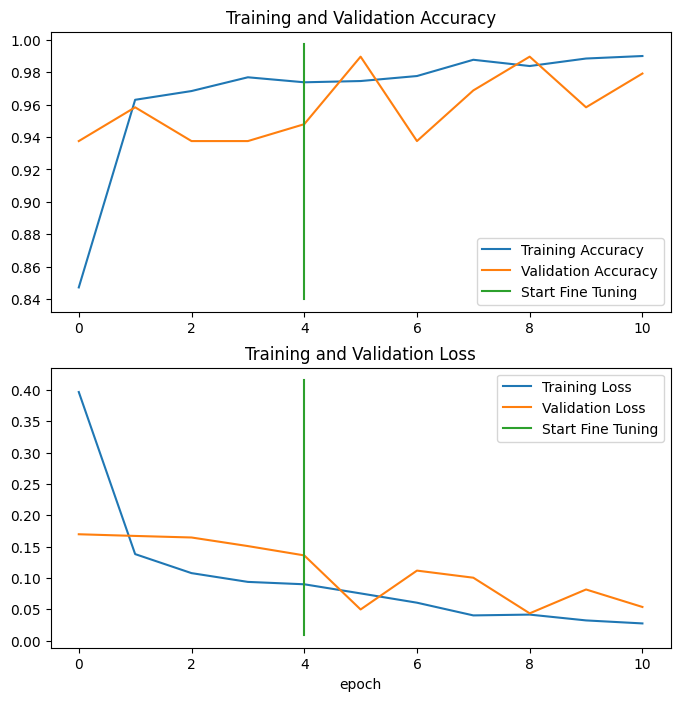

In [52]:
compare_historys(history_1, history_1_fine_tune_1)

In [53]:
# Model summary
model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, None   0         
 equential)                  )                                   
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 3)                 3843      
                                                           

In [58]:
# Getting test image file paths
test_data_img_paths = test_data.filepaths
np.random.shuffle(test_data_img_paths)
print("okay")
# Getting labels
test_data_labels = []
for path in test_data_img_paths:
  test_data_labels.append(path.split("\\")[5])

# Creating a dataframe of test paths
df_test_data_img_paths = pd.DataFrame({"Img Paths": test_data_img_paths,
                                       "Labels": test_data_labels})

df_test_data_img_paths.head()

okay


,Img Paths,Labels
0,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main
1,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main
2,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main
3,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main
4,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main


In [59]:
len(df_test_data_img_paths)

322

In [60]:
# Generating a test dataset for 
test_data_shuff = data_gen.flow_from_dataframe(df_test_data_img_paths, 
                                               directory="C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\skin-dataset", 
                                               x_col='Img Paths', y_col='Labels',
                                               shuffle=False,
                                               target_size=(224, 224))

Found 322 validated image filenames belonging to 1 classes.


In [61]:
# Loading the best model
# The same model architecture was trained on tensorflow==2.3.0 and then loaded here, trained on Tesla-K80
model = tf.keras.models.load_model("C:\\Users\\91983\\Downloads\\Real-TIme-Skin-Type-Detection-main\\Real-TIme-Skin-Type-Detection-main\\new_model.h5")

In [62]:
# Getting prediction probabilites
pred_prob = model.predict(test_data_shuff)
pred_prob[:20]

11/11 [==============================] - 14s 860ms/step


array([[9.9831784e-01, 9.9410943e-04, 6.8816124e-04],
       [1.3391598e-02, 9.8114496e-01, 5.4634619e-03],
       [3.2798226e-03, 9.9626249e-01, 4.5762208e-04],
       [4.7732654e-01, 6.0742404e-02, 4.6193105e-01],
       [5.4582298e-02, 9.4146413e-01, 3.9536050e-03],
       [4.5428122e-03, 9.9306607e-01, 2.3911560e-03],
       [5.3018513e-03, 9.9327648e-01, 1.4217232e-03],
       [9.8515469e-01, 1.1357615e-03, 1.3709564e-02],
       [7.7956328e-03, 9.8661047e-01, 5.5939234e-03],
       [6.7200908e-03, 9.8446643e-01, 8.8135051e-03],
       [7.1681822e-03, 9.8699188e-01, 5.8399481e-03],
       [4.7680369e-04, 9.9867839e-01, 8.4480853e-04],
       [3.8743152e-03, 9.8975921e-01, 6.3665016e-03],
       [8.6521373e-05, 9.9978989e-01, 1.2361461e-04],
       [6.7384166e-01, 2.5928831e-02, 3.0022958e-01],
       [1.4247574e-03, 9.9812979e-01, 4.4547408e-04],
       [8.7478990e-03, 9.8423600e-01, 7.0161056e-03],
       [1.4197568e-02, 9.8248726e-01, 3.3151021e-03],
       [9.9697351e-01, 1.532

In [63]:
y_pred = pred_prob.argmax(axis=1)
y_pred[:20]

array([0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
      dtype=int64)

In [64]:
# Labels 
test_data.class_indices

{'dry': 0, 'normal': 1, 'oily': 2}

In [65]:
# Converting our text labels into numbers
y_true = []
for label in test_data_labels:
  label_ = 0 if label == "dry" else 1
  y_true.append(label_)

y_true  = np.array(y_true)
y_true[:20]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

c:\Users\91983\Downloads\Real-TIme-Skin-Type-Detection-main\Real-TIme-Skin-Type-Detection-main\helper_functions.py:60: RuntimeWarning: invalid value encountered in divide
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it


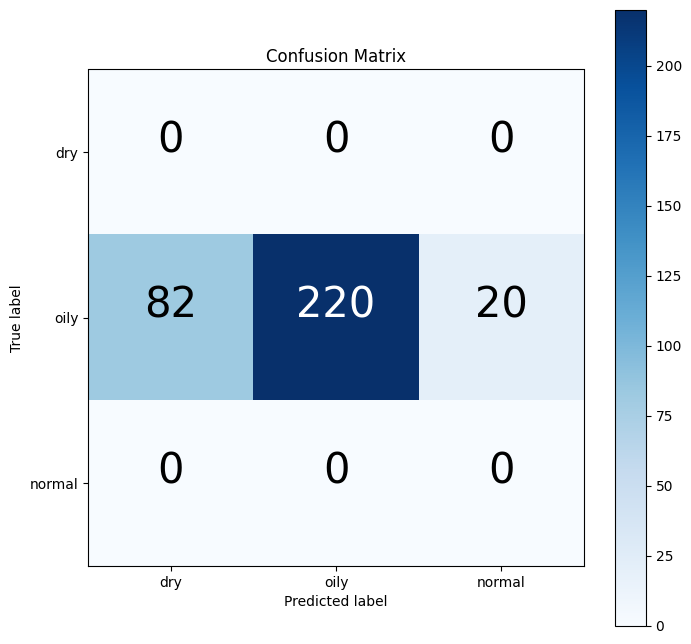

In [67]:
# Plotting a confusion matrix
class_names = ["dry", "oily", "normal"]

make_confusion_matrix(y_true=y_true,
                      y_pred=y_pred,
                      classes=class_names,
                      figsize=(8, 8),
                      text_size=30,
                      norm=False)

In [68]:
# To get suitable images
corrImgList = corrImgs(test_data_img_paths)

1/1 [==============================] - 0s 114ms/step


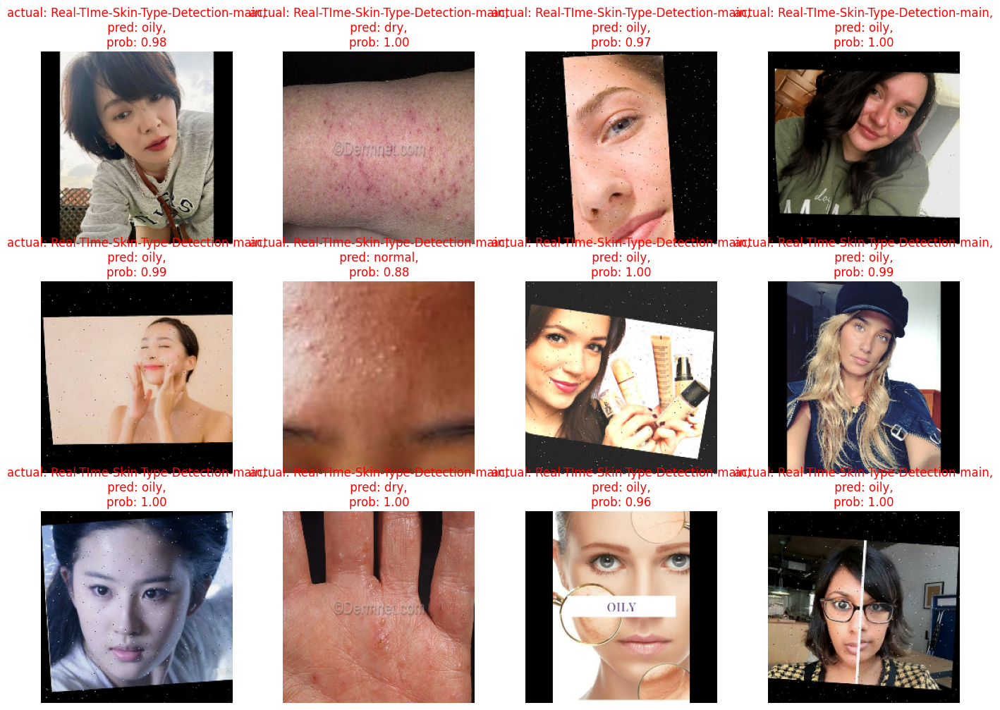

In [72]:
path_list = np.random.choice(corrImgList, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = path_list[i]
  class_name = img_path.split("\\")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name},\n pred: {pred_class}, \nprob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

In [74]:
# Getting test labels
test_labels = []
for path in test_data_img_paths:
  test_labels.append(path.split("\\")[5])

test_labels[:5]

['Real-TIme-Skin-Type-Detection-main',
 'Real-TIme-Skin-Type-Detection-main',
 'Real-TIme-Skin-Type-Detection-main',
 'Real-TIme-Skin-Type-Detection-main',
 'Real-TIme-Skin-Type-Detection-main']

In [75]:
df_pred = pd.DataFrame({"filename" : test_data_img_paths,
                         "label": test_labels,
                         "True": y_true,
                         "pred": y_pred})

df_pred.head(10)

,filename,label,True,pred
0,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,0
1,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
2,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
3,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,0
4,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
5,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
6,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
7,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,0
8,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1
9,C:\Users\91983\Downloads\Real-TIme-Skin-Type-D...,Real-TIme-Skin-Type-Detection-main,1,1


In [76]:
df_pred.to_csv("test-preds.csv")

In [77]:
len(test_data_img_paths)

322

In [78]:
# Wrong predicted images
wrng_pred_test_paths = []
for i in range(len(test_data_img_paths)):
  if y_true[i] != y_pred[i]:
    wrng_pred_test_paths.append(test_data_img_paths[i])

len(wrng_pred_test_paths)

102

1/1 [==============================] - 0s 91ms/step


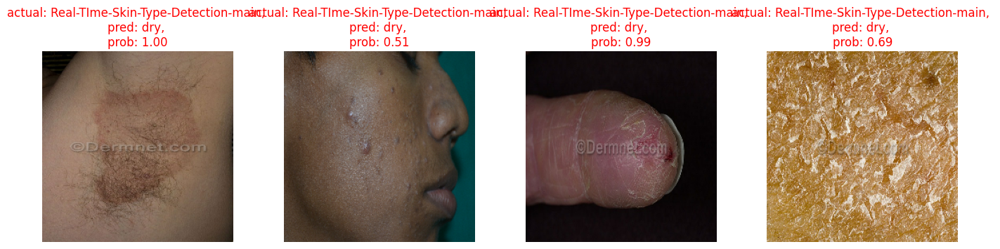

In [81]:
# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("\\")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, \npred: {pred_class}, \nprob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);